In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
plt.style.use('ggplot')
%matplotlib inline

# sklearn: data preprocessing
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import StandardScaler, LabelEncoder, OneHotEncoder

# sklearn: train model
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score, cross_validate, StratifiedKFold
from sklearn.metrics import precision_recall_curve, precision_score, recall_score, f1_score, accuracy_score
from sklearn.metrics import roc_curve, auc, roc_auc_score, confusion_matrix, classification_report

# sklearn classifiers
from sklearn import tree
from sklearn.tree import DecisionTreeClassifier
from sklearn import datasets, ensemble, model_selection
from sklearn.ensemble import RandomForestClassifier
from sklearn.neural_network import MLPClassifier

In [2]:
#Loading training and test data and concatanate


training_data = pd.read_csv('UNSW_NB15_training-set.csv')
testing_data = pd.read_csv('UNSW_NB15_testing-set.csv')

training_data

,id,dur,proto,service,state,spkts,dpkts,sbytes,dbytes,rate,...,ct_dst_sport_ltm,ct_dst_src_ltm,is_ftp_login,ct_ftp_cmd,ct_flw_http_mthd,ct_src_ltm,ct_srv_dst,is_sm_ips_ports,attack_cat,label
0,1,0.121478,tcp,-,FIN,6,4,258,172,74.087490,...,1,1,0,0,0,1,1,0,Normal,0
1,2,0.649902,tcp,-,FIN,14,38,734,42014,78.473372,...,1,2,0,0,0,1,6,0,Normal,0
2,3,1.623129,tcp,-,FIN,8,16,364,13186,14.170161,...,1,3,0,0,0,2,6,0,Normal,0
3,4,1.681642,tcp,ftp,FIN,12,12,628,770,13.677108,...,1,3,1,1,0,2,1,0,Normal,0
4,5,0.449454,tcp,-,FIN,10,6,534,268,33.373826,...,1,40,0,0,0,2,39,0,Normal,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
175336,175337,0.000009,udp,dns,INT,2,0,114,0,111111.107200,...,13,24,0,0,0,24,24,0,Generic,1
175337,175338,0.505762,tcp,-,FIN,10,8,620,354,33.612649,...,1,2,0,0,0,1,1,0,Shellcode,1
175338,175339,0.000009,udp,dns,INT,2,0,114,0,111111.107200,...,3,13,0,0,0,3,12,0,Generic,1
175339,175340,0.000009,udp,dns,INT,2,0,114,0,111111.107200,...,14,30,0,0,0,30,30,0,Generic,1


In [3]:
testing_data

,id,dur,proto,service,state,spkts,dpkts,sbytes,dbytes,rate,...,ct_dst_sport_ltm,ct_dst_src_ltm,is_ftp_login,ct_ftp_cmd,ct_flw_http_mthd,ct_src_ltm,ct_srv_dst,is_sm_ips_ports,attack_cat,label
0,1,0.000011,udp,-,INT,2,0,496,0,90909.090200,...,1,2,0,0,0,1,2,0,Normal,0
1,2,0.000008,udp,-,INT,2,0,1762,0,125000.000300,...,1,2,0,0,0,1,2,0,Normal,0
2,3,0.000005,udp,-,INT,2,0,1068,0,200000.005100,...,1,3,0,0,0,1,3,0,Normal,0
3,4,0.000006,udp,-,INT,2,0,900,0,166666.660800,...,1,3,0,0,0,2,3,0,Normal,0
4,5,0.000010,udp,-,INT,2,0,2126,0,100000.002500,...,1,3,0,0,0,2,3,0,Normal,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
82327,82328,0.000005,udp,-,INT,2,0,104,0,200000.005100,...,1,2,0,0,0,2,1,0,Normal,0
82328,82329,1.106101,tcp,-,FIN,20,8,18062,354,24.410067,...,1,1,0,0,0,3,2,0,Normal,0
82329,82330,0.000000,arp,-,INT,1,0,46,0,0.000000,...,1,1,0,0,0,1,1,1,Normal,0
82330,82331,0.000000,arp,-,INT,1,0,46,0,0.000000,...,1,1,0,0,0,1,1,1,Normal,0


In [4]:
concatenated_data = pd.concat([training_data, testing_data])
concatenated_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 257673 entries, 0 to 82331
Data columns (total 45 columns):
 #   Column             Non-Null Count   Dtype  
---  ------             --------------   -----  
 0   id                 257673 non-null  int64  
 1   dur                257673 non-null  float64
 2   proto              257673 non-null  object 
 3   service            257673 non-null  object 
 4   state              257673 non-null  object 
 5   spkts              257673 non-null  int64  
 6   dpkts              257673 non-null  int64  
 7   sbytes             257673 non-null  int64  
 8   dbytes             257673 non-null  int64  
 9   rate               257673 non-null  float64
 10  sttl               257673 non-null  int64  
 11  dttl               257673 non-null  int64  
 12  sload              257673 non-null  float64
 13  dload              257673 non-null  float64
 14  sloss              257673 non-null  int64  
 15  dloss              257673 non-null  int64  
 16  sin

In [5]:
unique_categories = concatenated_data['attack_cat'].unique()

unique_categories

array(['Normal', 'Backdoor', 'Analysis', 'Fuzzers', 'Shellcode',
       'Reconnaissance', 'Exploits', 'DoS', 'Worms', 'Generic'],
      dtype=object)

In [6]:
unique_labels = concatenated_data['label'].unique()

unique_labels

array([0, 1], dtype=int64)

In [7]:
concatenated_data.isnull().sum()

id                   0
dur                  0
proto                0
service              0
state                0
spkts                0
dpkts                0
sbytes               0
dbytes               0
rate                 0
sttl                 0
dttl                 0
sload                0
dload                0
sloss                0
dloss                0
sinpkt               0
dinpkt               0
sjit                 0
djit                 0
swin                 0
stcpb                0
dtcpb                0
dwin                 0
tcprtt               0
synack               0
ackdat               0
smean                0
dmean                0
trans_depth          0
response_body_len    0
ct_srv_src           0
ct_state_ttl         0
ct_dst_ltm           0
ct_src_dport_ltm     0
ct_dst_sport_ltm     0
ct_dst_src_ltm       0
is_ftp_login         0
ct_ftp_cmd           0
ct_flw_http_mthd     0
ct_src_ltm           0
ct_srv_dst           0
is_sm_ips_ports      0
attack_cat 

In [8]:
useful_data = concatenated_data.dropna()

In [9]:
useful_data.shape

(257673, 45)

<AxesSubplot:>

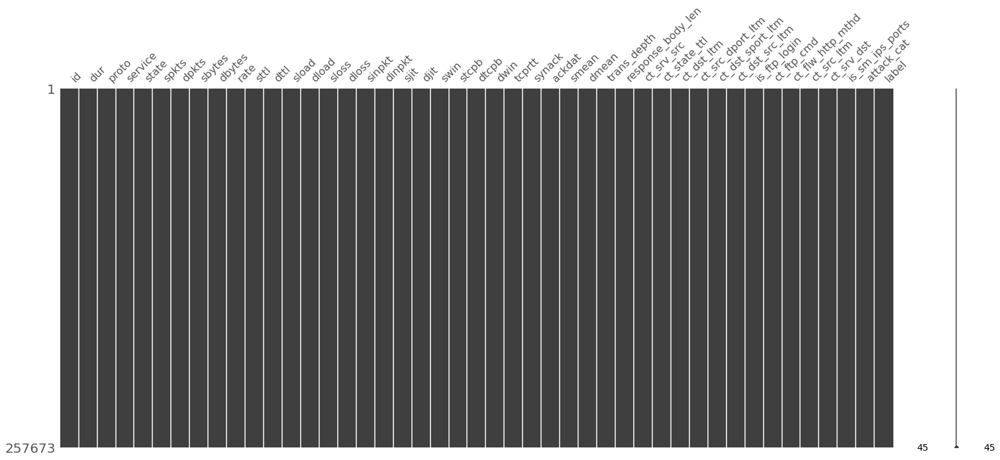

In [10]:
import missingno
import pickle

missingno.matrix(useful_data)

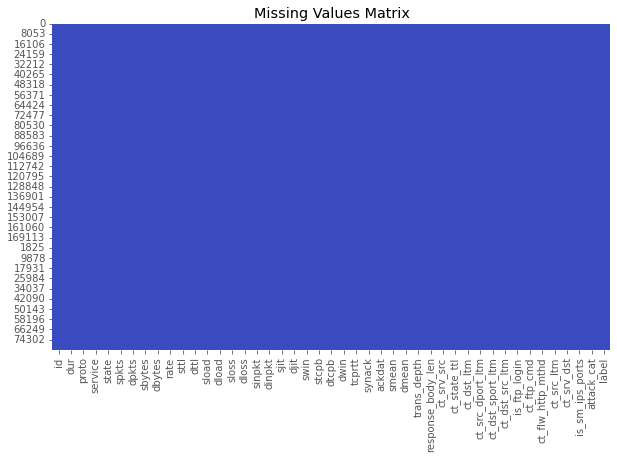

In [11]:
plt.figure(figsize=(10,6))
sns.heatmap(useful_data.isnull(), cbar=False, cmap='coolwarm')
plt.title('Missing Values Matrix')
plt.show()

In [12]:
useful_data.describe(include="all")

,id,dur,proto,service,state,spkts,dpkts,sbytes,dbytes,rate,...,ct_dst_sport_ltm,ct_dst_src_ltm,is_ftp_login,ct_ftp_cmd,ct_flw_http_mthd,ct_src_ltm,ct_srv_dst,is_sm_ips_ports,attack_cat,label
count,257673.000000,257673.000000,257673,257673,257673,257673.000000,257673.000000,2.576730e+05,2.576730e+05,2.576730e+05,...,257673.000000,257673.000000,257673.000000,257673.000000,257673.000000,257673.000000,257673.000000,257673.000000,257673,257673.000000
unique,NaN,NaN,133,13,11,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,10,NaN
top,NaN,NaN,tcp,-,FIN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Normal,NaN
freq,NaN,NaN,123041,141321,117164,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,93000,NaN
mean,72811.823858,1.246715,NaN,NaN,NaN,19.777144,18.514703,8.572952e+03,1.438729e+04,9.125391e+04,...,4.032677,8.322964,0.012819,0.012850,0.132005,6.800045,9.121049,0.014274,NaN,0.639077
std,48929.917641,5.974305,NaN,NaN,NaN,135.947152,111.985965,1.737739e+05,1.461993e+05,1.603446e+05,...,5.831515,11.120754,0.116091,0.116421,0.681854,8.396266,10.874752,0.118618,NaN,0.480269
min,1.000000,0.000000,NaN,NaN,NaN,1.000000,0.000000,2.400000e+01,0.000000e+00,0.000000e+00,...,1.000000,1.000000,0.000000,0.000000,0.000000,1.000000,1.000000,0.000000,NaN,0.000000
25%,32210.000000,0.000008,NaN,NaN,NaN,2.000000,0.000000,1.140000e+02,0.000000e+00,3.078928e+01,...,1.000000,1.000000,0.000000,0.000000,0.000000,2.000000,2.000000,0.000000,NaN,0.000000
50%,64419.000000,0.004285,NaN,NaN,NaN,4.000000,2.000000,5.280000e+02,1.780000e+02,2.955665e+03,...,1.000000,3.000000,0.000000,0.000000,0.000000,3.000000,4.000000,0.000000,NaN,1.000000
75%,110923.000000,0.685777,NaN,NaN,NaN,12.000000,10.000000,1.362000e+03,1.064000e+03,1.250000e+05,...,3.000000,8.000000,0.000000,0.000000,0.000000,8.000000,11.000000,0.000000,NaN,1.000000


<AxesSubplot:>

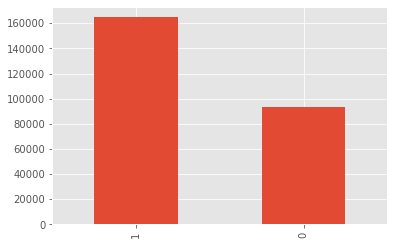

In [13]:
useful_data['label'].value_counts().plot.bar()

<AxesSubplot:>

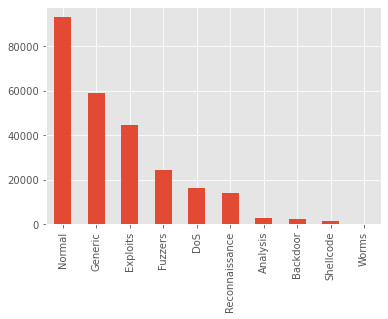

In [14]:
useful_data['attack_cat'].value_counts().plot.bar()

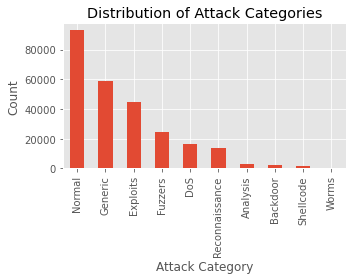

In [15]:
plt.figure(figsize=(5, 4))
useful_data['attack_cat'].value_counts().plot.bar()
plt.xlabel('Attack Category')
plt.ylabel('Count')
plt.title('Distribution of Attack Categories')
plt.tight_layout()
plt.show()

In [16]:
useful_data['label'].value_counts(normalize=True)

1    0.639077
0    0.360923
Name: label, dtype: float64

## Dataset Balance Ratio

In [17]:
labels = useful_data['label']
attacks = useful_data['attack_cat']

Distributions of labels: 0.6:1 (93000/164673)


c:\ProgramData\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


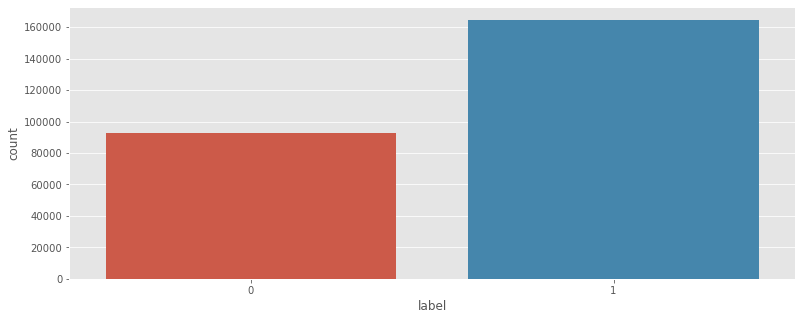

In [18]:
def AttackLabel_ratio(input):
    
    #Calculate ratio
    
    unique, count = np.unique(input, return_counts=True)
    ratio = round(count[0]/count[1], 1)
    return f'{ratio}:1 ({count[0]}/{count[1]})'

print('Distributions of labels:', AttackLabel_ratio(labels))
plt.figure(figsize=(13,5))
sns.countplot(labels,label="Sum")
plt.show()

Distribution of attack types: 1.1:1 (2677/2329)


c:\ProgramData\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


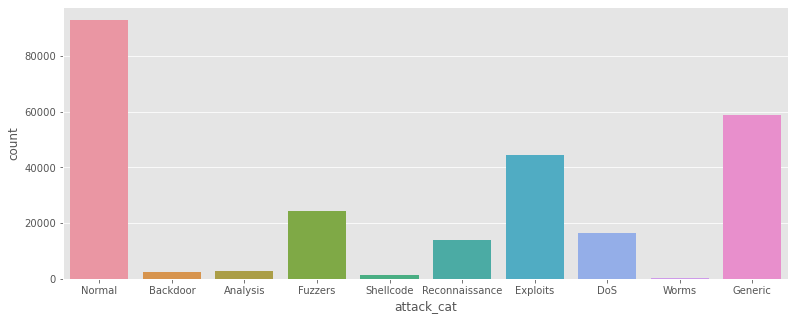

In [19]:
print('Distribution of attack types:', AttackLabel_ratio(attacks))
plt.figure(figsize=(13,5))
sns.countplot(attacks,label="Sum")
plt.show()

### Encoding categorical features Encoding categorical features using LabelEncoder.

In [20]:
# Select categorical columns
categorical_columns = useful_data.select_dtypes(include=['object']).columns
# Encode categorical features with LabelEncoder
encoding = LabelEncoder()
useful_data[categorical_columns] = useful_data[categorical_columns].apply(encoding.fit_transform)

In [21]:
useful_data.head()

,id,dur,proto,service,state,spkts,dpkts,sbytes,dbytes,rate,...,ct_dst_sport_ltm,ct_dst_src_ltm,is_ftp_login,ct_ftp_cmd,ct_flw_http_mthd,ct_src_ltm,ct_srv_dst,is_sm_ips_ports,attack_cat,label
0,1,0.121478,113,0,4,6,4,258,172,74.087490,...,1,1,0,0,0,1,1,0,6,0
1,2,0.649902,113,0,4,14,38,734,42014,78.473372,...,1,2,0,0,0,1,6,0,6,0
2,3,1.623129,113,0,4,8,16,364,13186,14.170161,...,1,3,0,0,0,2,6,0,6,0
3,4,1.681642,113,3,4,12,12,628,770,13.677108,...,1,3,1,1,0,2,1,0,6,0
4,5,0.449454,113,0,4,10,6,534,268,33.373826,...,1,40,0,0,0,2,39,0,6,0


# Data Correlation

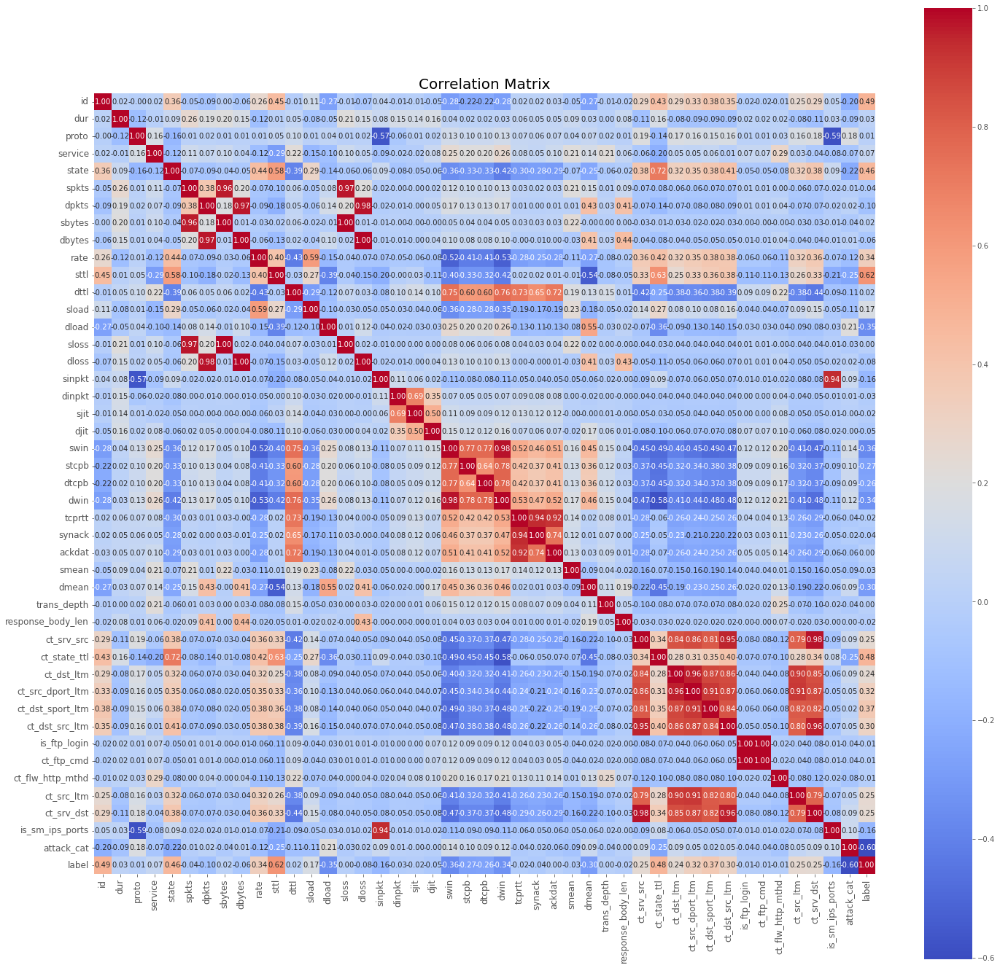

In [22]:
fig = plt.figure(figsize=(24, 24))
sns.heatmap(useful_data.corr(), cmap='coolwarm', annot=True, fmt='.2f', square=True)
plt.title('Correlation Matrix', fontsize=20)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.show()

fig.savefig('Features with Corelation.png')

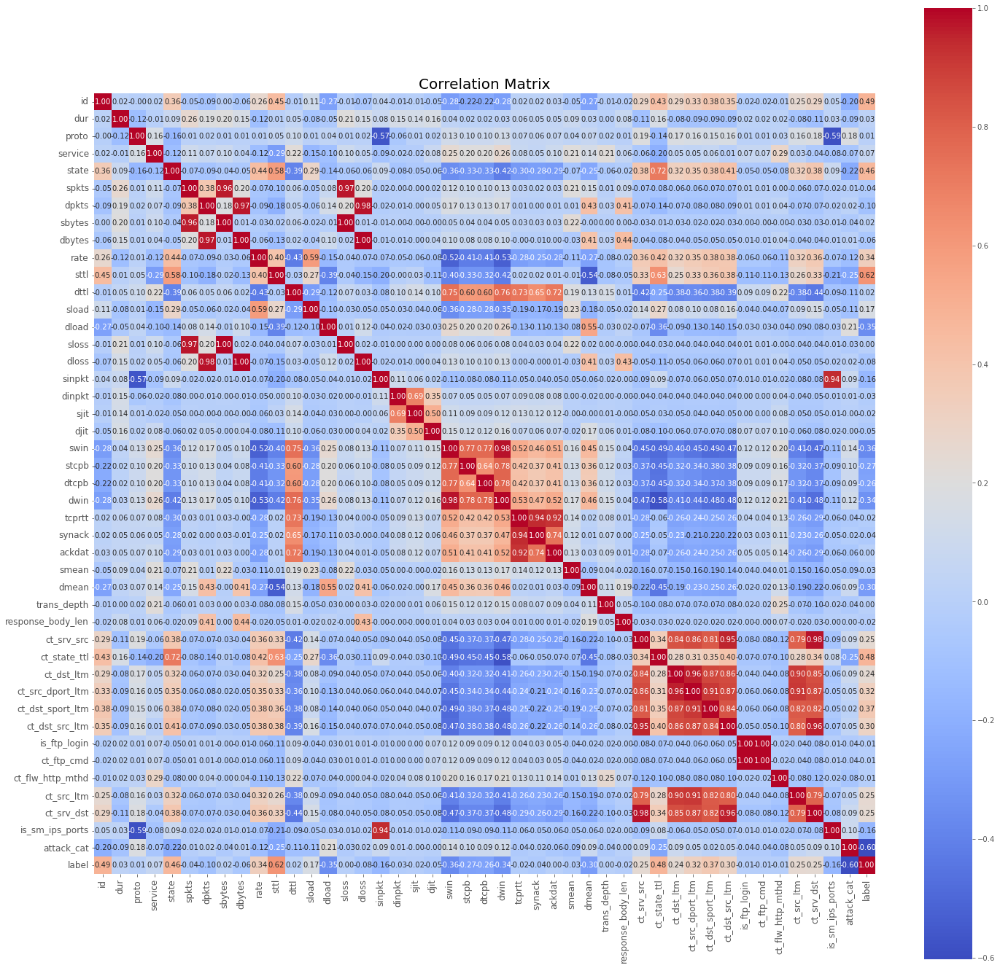

In [23]:
plt.figure(figsize=(24, 24))
sns.heatmap(useful_data.corr(), cmap='coolwarm', annot=True, fmt='.2f', square=True)
plt.title('Correlation Matrix', fontsize=20)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)

fig = plt.gcf()
fig.savefig('Features with Corelation.png', dpi=300)

In [24]:
corr_matrix = useful_data.corr().abs()
correlated_vars = corr_matrix[corr_matrix > 0.98].stack().reset_index()
correlated_vars = correlated_vars[correlated_vars['level_0'] < correlated_vars['level_1']]
correlated_vars.columns = ['Var1', 'Var2', 'Corr']
correlated_vars = correlated_vars.sort_values(by='Corr', ascending=False)
print(correlated_vars)

          Var1          Var2      Corr
45  ct_ftp_cmd  is_ftp_login  0.998855
10      dbytes         dloss  0.996711
8       sbytes         sloss  0.995772
28        dwin          swin  0.980458


In [25]:
corr_matrix = useful_data.corr().abs()
upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(bool))
to_drop = [column for column in upper.columns if any(upper[column] > 0.98)]
useful_data = useful_data.drop(columns=to_drop)

In [26]:
useful_data

,id,dur,proto,service,state,spkts,dpkts,sbytes,dbytes,rate,...,ct_src_dport_ltm,ct_dst_sport_ltm,ct_dst_src_ltm,is_ftp_login,ct_flw_http_mthd,ct_src_ltm,ct_srv_dst,is_sm_ips_ports,attack_cat,label
0,1,0.121478,113,0,4,6,4,258,172,74.087490,...,1,1,1,0,0,1,1,0,6,0
1,2,0.649902,113,0,4,14,38,734,42014,78.473372,...,1,1,2,0,0,1,6,0,6,0
2,3,1.623129,113,0,4,8,16,364,13186,14.170161,...,1,1,3,0,0,2,6,0,6,0
3,4,1.681642,113,3,4,12,12,628,770,13.677108,...,1,1,3,1,0,2,1,0,6,0
4,5,0.449454,113,0,4,10,6,534,268,33.373826,...,2,1,40,0,0,2,39,0,6,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
82327,82328,0.000005,119,0,5,2,0,104,0,200000.005100,...,1,1,2,0,0,2,1,0,6,0
82328,82329,1.106101,113,0,4,20,8,18062,354,24.410067,...,1,1,1,0,0,3,2,0,6,0
82329,82330,0.000000,6,0,5,1,0,46,0,0.000000,...,1,1,1,0,0,1,1,1,6,0
82330,82331,0.000000,6,0,5,1,0,46,0,0.000000,...,1,1,1,0,0,1,1,1,6,0


In [27]:
useful_data = useful_data.drop(axis=1, columns=['id','attack_cat'])

In [28]:
useful_data

,dur,proto,service,state,spkts,dpkts,sbytes,dbytes,rate,sttl,...,ct_dst_ltm,ct_src_dport_ltm,ct_dst_sport_ltm,ct_dst_src_ltm,is_ftp_login,ct_flw_http_mthd,ct_src_ltm,ct_srv_dst,is_sm_ips_ports,label
0,0.121478,113,0,4,6,4,258,172,74.087490,252,...,1,1,1,1,0,0,1,1,0,0
1,0.649902,113,0,4,14,38,734,42014,78.473372,62,...,1,1,1,2,0,0,1,6,0,0
2,1.623129,113,0,4,8,16,364,13186,14.170161,62,...,2,1,1,3,0,0,2,6,0,0
3,1.681642,113,3,4,12,12,628,770,13.677108,62,...,2,1,1,3,1,0,2,1,0,0
4,0.449454,113,0,4,10,6,534,268,33.373826,254,...,2,2,1,40,0,0,2,39,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
82327,0.000005,119,0,5,2,0,104,0,200000.005100,254,...,2,1,1,2,0,0,2,1,0,0
82328,1.106101,113,0,4,20,8,18062,354,24.410067,254,...,2,1,1,1,0,0,3,2,0,0
82329,0.000000,6,0,5,1,0,46,0,0.000000,0,...,1,1,1,1,0,0,1,1,1,0
82330,0.000000,6,0,5,1,0,46,0,0.000000,0,...,1,1,1,1,0,0,1,1,1,0


In [29]:
X = useful_data.drop(columns=['label'])
feature_list = list(X.columns)

In [30]:
print(len(feature_list))
feature_list

38


['dur',
 'proto',
 'service',
 'state',
 'spkts',
 'dpkts',
 'sbytes',
 'dbytes',
 'rate',
 'sttl',
 'dttl',
 'sload',
 'dload',
 'sinpkt',
 'dinpkt',
 'sjit',
 'djit',
 'swin',
 'stcpb',
 'dtcpb',
 'tcprtt',
 'synack',
 'ackdat',
 'smean',
 'dmean',
 'trans_depth',
 'response_body_len',
 'ct_srv_src',
 'ct_state_ttl',
 'ct_dst_ltm',
 'ct_src_dport_ltm',
 'ct_dst_sport_ltm',
 'ct_dst_src_ltm',
 'is_ftp_login',
 'ct_flw_http_mthd',
 'ct_src_ltm',
 'ct_srv_dst',
 'is_sm_ips_ports']

In [31]:
y = useful_data['label']


# Train/Test Splitting

In [32]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3)

In [33]:
print("Training set:", len(X_train))
print("Testing set:", len(X_test))

Training set: 180371
Testing set: 77302


In [34]:
standardrize_feature = StandardScaler().fit(X_train)
X_train = standardrize_feature.transform(X_train)
X_test = standardrize_feature.transform(X_test)

In [35]:
print(X_train.shape)
print(X_test.shape)

(180371, 38)
(77302, 38)


In [36]:
X_train_reshaped = X_train.reshape(X_train.shape[0], 38, 1)
X_test_reshaped = X_test.reshape(X_test.shape[0], 38, 1)

In [37]:
y_train = y_train.values
y_test = y_test.values

# Autoencoder model

In [38]:
import tensorflow as tf
from tensorflow.keras import backend as K
from tensorflow.keras import layers
from tensorflow.keras.models import Model, Sequential
from tensorflow.keras.layers import Input, Conv2D, SeparableConv2D, Dense, Flatten, Dropout, Activation, BatchNormalization, MaxPooling2D, GlobalAveragePooling2D, concatenate, Conv2DTranspose
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping,ModelCheckpoint
from tensorflow.keras.preprocessing import image_dataset_from_directory
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications.imagenet_utils import preprocess_input
from tensorflow.keras import utils as np_utils
from tensorflow.keras.metrics import Precision, Recall, Accuracy
from tensorflow.keras.wrappers.scikit_learn import KerasClassifier

import os
from os import listdir
from os.path import isfile, join
import copy
import random

from tensorflow.keras.applications import VGG16
from tensorflow.keras.layers import MaxPool2D, Reshape, Concatenate
from tensorflow.keras.regularizers import l2

import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from keras.layers import Dense, Flatten, Reshape, Input, InputLayer, LeakyReLU
from keras.models import Sequential, Model

In [39]:
from keras import backend as K

def recall_m(y_true, y_pred):
    true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
    possible_positives = K.sum(K.round(K.clip(y_true, 0, 1)))
    recall = true_positives / (possible_positives + K.epsilon())
    return recall

def precision_m(y_true, y_pred):
    true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
    predicted_positives = K.sum(K.round(K.clip(y_pred, 0, 1)))
    precision = true_positives / (predicted_positives + K.epsilon())
    return precision

def f1_m(y_true, y_pred):
    precision = precision_m(y_true, y_pred)
    recall = recall_m(y_true, y_pred)
    return 2*((precision*recall)/(precision+recall+K.epsilon()))

# Tensorflow Model #1

In [145]:
# input placeholder
input_data = Input(shape=(X_train.shape[1],)) # number of features/columns

# encoder is the encoded representation of the input
encoded = Dense(32, activation ='relu')(input_data)

# decoder is the lossy reconstruction of the input
decoded = Dense(X_train.shape[1], activation ='relu')(encoded) # number of features and should match input_data
decoded = Dense(1, activation='sigmoid')(decoded)

# model optimizer and loss
autoencoder = Model(input_data, decoded)

# loss function and optimizer
autoencoder.compile(optimizer='adam', loss='mean_squared_error', metrics=['accuracy',f1_m,precision_m, recall_m])

autoencoder.summary()

Model: "model_39"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_82 (InputLayer)        [(None, 38)]              0         
_________________________________________________________________
dense_107 (Dense)            (None, 32)                1248      
_________________________________________________________________
dense_108 (Dense)            (None, 38)                1254      
_________________________________________________________________
dense_109 (Dense)            (None, 1)                 39        
Total params: 2,541
Trainable params: 2,541
Non-trainable params: 0
_________________________________________________________________


# Tensorflow Model #2

In [40]:
# define encoder
input = Input(shape=(X_train.shape[1],))

# encoder level 1
e = Dense(64)(input)
e = BatchNormalization()(e)
e = LeakyReLU()(e)

# encoder level 2
e = Dense(32)(e)
e = BatchNormalization()(e)
e = LeakyReLU()(e)

# bottleneck
bottleneck = Dense(32)(e)

# decoder, level 1
d = Dense(32)(bottleneck)
d = BatchNormalization()(d)
d = LeakyReLU()(d)

# decoder level 2
d = Dense(64)(d)
d = BatchNormalization()(d)
d = LeakyReLU()(d)

# output layer
output = Dense(1, activation='sigmoid')(d)

# define autoencoder model
autoencoder = Model(inputs=input, outputs=output)

autoencoder.compile(optimizer='adam', loss='mean_squared_error', metrics=['accuracy',f1_m,precision_m, recall_m])

autoencoder.summary()

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 38)]              0         
_________________________________________________________________
dense (Dense)                (None, 64)                2496      
_________________________________________________________________
tf.math.multiply (TFOpLambda (None, 64)                0         
_________________________________________________________________
tf.__operators__.add (TFOpLa (None, 64)                0         
_________________________________________________________________
leaky_re_lu (LeakyReLU)      (None, 64)                0         
_________________________________________________________________
dense_1 (Dense)              (None, 32)                2080      
_________________________________________________________________
tf.math.multiply_1 (TFOpLamb (None, 32)                0     

In [43]:
import time

early_stop = EarlyStopping(monitor='val_loss', 
                        mode='min', 
                        patience = 10 ,
                        restore_best_weights=True)
#model_checkpoint
mc = ModelCheckpoint('unsw_nb15_model_autoencoder.h5', monitor='val_loss', mode='min', verbose=1, save_best_only=True)

start_train = time.time()
history = autoencoder.fit(X_train, y_train, 
            validation_data = (X_test, y_test), 
            epochs = 20, 
            verbose = 1,
            batch_size = 64,
            callbacks = [early_stop,mc])
end_train = time.time()

Epoch 1/20
2819/2819 [==============================] - 15s 4ms/step - loss: 0.0605 - accuracy: 0.9104 - f1_m: 0.9301 - precision_m: 0.9153 - recall_m: 0.9483 - val_loss: 0.0514 - val_accuracy: 0.9235 - val_f1_m: 0.9402 - val_precision_m: 0.9296 - val_recall_m: 0.9524

Epoch 00001: val_loss improved from inf to 0.05135, saving model to unsw_nb15_model_autoencoder.h5
Epoch 2/20
2819/2819 [==============================] - 11s 4ms/step - loss: 0.0514 - accuracy: 0.9231 - f1_m: 0.9392 - precision_m: 0.9376 - recall_m: 0.9425 - val_loss: 0.0510 - val_accuracy: 0.9256 - val_f1_m: 0.9404 - val_precision_m: 0.9518 - val_recall_m: 0.9306

Epoch 00002: val_loss improved from 0.05135 to 0.05099, saving model to unsw_nb15_model_autoencoder.h5
Epoch 3/20
2819/2819 [==============================] - 10s 4ms/step - loss: 0.0500 - accuracy: 0.9252 - f1_m: 0.9408 - precision_m: 0.9418 - recall_m: 0.9416 - val_loss: 0.0489 - val_accuracy: 0.9269 - val_f1_m: 0.9424 - val_precision_m: 0.9388 - val_recall

In [41]:
print("Train score:", autoencoder.evaluate(X_train, y_train))
print("Test score:", autoencoder.evaluate(X_test, y_test))
loss, accuracy, f1_score, precision, recall = autoencoder.evaluate(X_test, y_test)

5637/5637 [==============================] - 19s 2ms/step - loss: 0.2652 - accuracy: 0.3633 - f1_m: 0.0064 - precision_m: 0.0693 - recall_m: 0.0034
Train score: [0.26504597067832947, 0.3632124960422516, 0.006421618163585663, 0.06821003556251526, 0.0033749814610928297]
2416/2416 [==============================] - 5s 2ms/step - loss: 0.2656 - accuracy: 0.3620 - f1_m: 0.0054 - precision_m: 0.0571 - recall_m: 0.0028
Test score: [0.2656407654285431, 0.36195701360702515, 0.005355062894523144, 0.05711919814348221, 0.0028130486607551575]
2416/2416 [==============================] - 5s 2ms/step - loss: 0.2656 - accuracy: 0.3620 - f1_m: 0.0054 - precision_m: 0.0571 - recall_m: 0.0028


# Learning Curves (Accuracy/Loss vs Epoch)

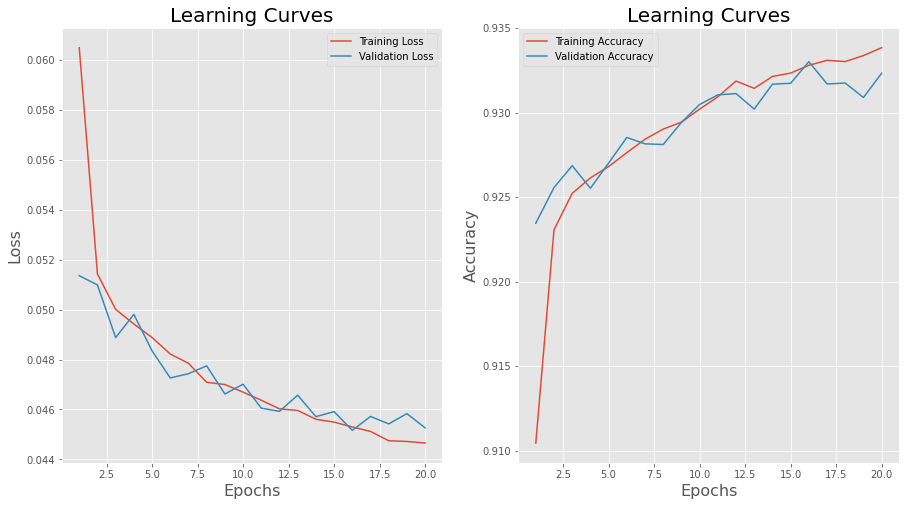

In [44]:
# Extract accuracies from the training history
train_acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

# Extract losses from the training history
train_loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(1, len(train_loss) + 1)


# Generate learning curves
fig, ax = plt.subplots(1,2,figsize=(15,8))

ax[0].plot(epochs, train_loss, label='Training Loss')
ax[0].plot(epochs, val_loss, label='Validation Loss')
ax[0].set_title('Learning Curves', fontsize = 20)
ax[0].set_xlabel('Epochs', fontsize = 16)
ax[0].set_ylabel('Loss',fontsize = 16)
ax[0].legend()
ax[0].grid(True)

ax[1].plot(epochs, train_acc, label='Training Accuracy')
ax[1].plot(epochs, val_acc, label='Validation Accuracy')
ax[1].set_title('Learning Curves',fontsize = 20)
ax[1].set_xlabel('Epochs', fontsize = 16)
ax[1].set_ylabel('Accuracy', fontsize = 16)
ax[1].legend()
ax[1].grid(True)

plt.show()

# Learning Curves (Accuracy vs Loss)

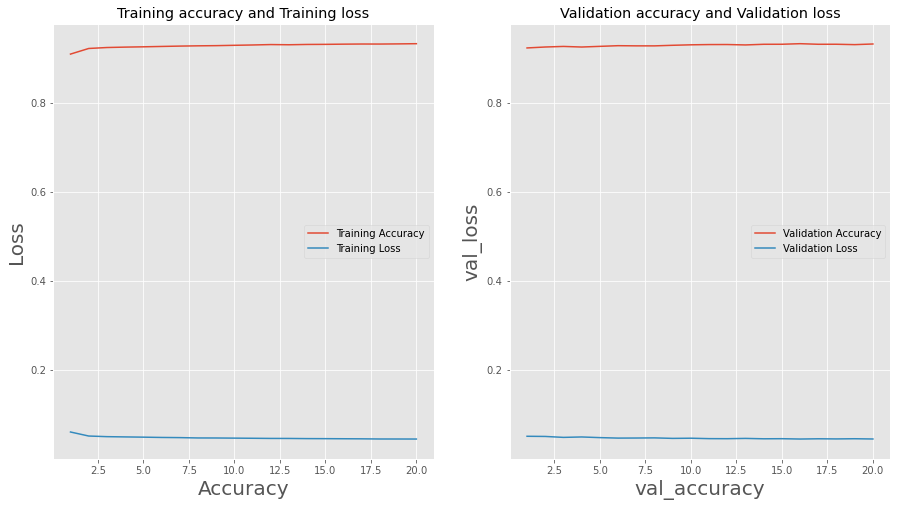

In [45]:
epochs = range(1, len(train_loss) + 1)

fig, ax = plt.subplots(1,2,figsize=(15,8))  
ax[0].plot(epochs, train_acc,label = 'Training Accuracy')
ax[0].plot(epochs, train_loss,label = 'Training Loss')
ax[0].set_title('Training accuracy and Training loss')
ax[0].set_xlabel('Accuracy', fontsize = 20)
ax[0].set_ylabel('Loss', fontsize = 20)
ax[0].legend()
ax[0].grid(True)

ax[1].plot(epochs, val_acc,label = 'Validation Accuracy')
ax[1].plot(epochs, val_loss,label = 'Validation Loss')
ax[1].set_title('Validation accuracy and Validation loss')
ax[1].set_xlabel('val_accuracy', fontsize = 20)
ax[1].set_ylabel('val_loss', fontsize = 20)
ax[1].legend()
ax[1].grid(True)

plt.show()

# Predictions and Accuracy Score

In [46]:
LabelsToClasses = {'Normal': 0,'Attack': 1}
ClassesToLabels = {0:'Normal', 1:'Attack'}

In [50]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from tensorflow.keras.applications.imagenet_utils import preprocess_input
import copy

x = preprocess_input(copy.deepcopy(X_test))
y_preds = autoencoder.predict(x)
k = np.argmax(y_preds)
p = np.max(y_preds)

y_preds = np.argmax(y_preds, axis=1)
y_trues = np.argmax(y_test, axis=1)

print(y_preds)
print(y_trues)
# Evaluate the classifier
cm = confusion_matrix(y_trues, y_preds)
accuracy = accuracy_score(y_trues, y_preds)
print(f"Accuracy: {accuracy}")

AxisError: axis 1 is out of bounds for array of dimension 1

In [115]:
from sklearn.metrics import classification_report

y_pred = autoencoder.predict(X_test, batch_size=64, verbose=1)
y_pred_bool = np.argmax(y_pred, axis=1)

print(classification_report(y_test, y_pred_bool))

1208/1208 [==============================] - 1s 873us/step
              precision    recall  f1-score   support

           0       0.36      1.00      0.53     27853
           1       0.00      0.00      0.00     49449

    accuracy                           0.36     77302
   macro avg       0.18      0.50      0.26     77302
weighted avg       0.13      0.36      0.19     77302



Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.


In [119]:
from tabulate import tabulate

training_time = end_train - start_train

table_data = [["Training score", accuracy],
              ["Accuracy", accuracy],
              ["Precision", precision],
              ["Recall", recall],
              ["F1", f1_score],
              ["Time Required", training_time],
              ]

table_header = ["Metric", "Value"]
print(tabulate(table_data, headers=table_header))

Metric               Value
--------------  ----------
Training score    0.934219
Accuracy          0.934219
Precision         0.950478
Recall            0.946289
F1                0.947161
Time Required   272.535


In [166]:
from sklearn.metrics import confusion_matrix, precision_score, recall_score, f1_score
from tabulate import tabulate

# Predict on the test set
y_pred = autoencoder.predict(X_test)
y_pred = np.squeeze(y_pred)
print(y_pred.shape)
print(y_test.shape)
# Evaluate the classifier

train_score = autoencoder.score(X_train, y_train)
accuracy = autoencoder.score(X_test, y_test)
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)
training_time = end_train - start_train
support = np.sum(confusion_matrix(y_test, y_pred), axis=1)
    
table_data = [["Training score", train_score],
              ["Accuracy", accuracy],
              ["Precision", precision],
              ["Recall", recall],
              ["F1", f1],
              ["Time Required", training_time],
              ["Support", support[1]],
              ]

table_header = ["Metric", "Value"]
print(tabulate(table_data, headers=table_header))

(77302,)
(77302,)
1208/1208 [==============================] - 2s 2ms/step - loss: 0.1318 - accuracy: 0.9344 - f1_m: 0.9486 - precision_m: 0.9412 - recall_m: 0.9574


ValueError: Classification metrics can't handle a mix of binary and continuous targets

# Classification Report

In [52]:
# Generate a classification report
report = classification_report(y_test, y_preds, target_names=ClassesToLabels.values())
print(report)

              precision    recall  f1-score   support

      Normal       0.36      1.00      0.53     27853
      Attack       0.00      0.00      0.00     49449

    accuracy                           0.36     77302
   macro avg       0.18      0.50      0.26     77302
weighted avg       0.13      0.36      0.19     77302



c:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [41]:
# Generate a classification report
report = classification_report(y_test, y_pred, target_names=ClassesToLabels.values())
print(report)

              precision    recall  f1-score   support

      Normal       0.91      0.92      0.91     27952
      Attack       0.95      0.95      0.95     49350

    accuracy                           0.94     77302
   macro avg       0.93      0.93      0.93     77302
weighted avg       0.94      0.94      0.94     77302



# Confusion Matrix

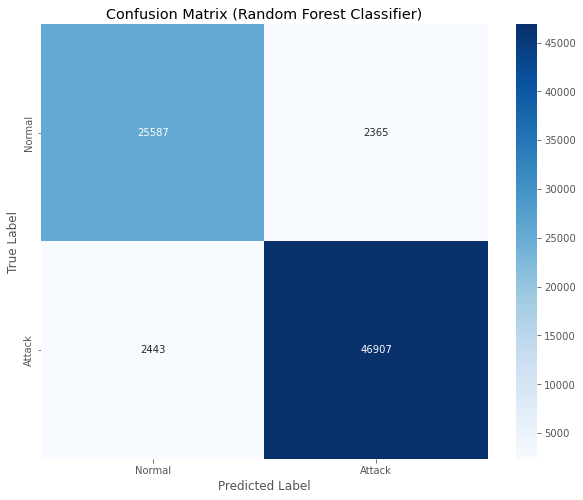

In [42]:
# Generate confusion matrix
cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, cmap="Blues", fmt="d", 
            xticklabels=list(LabelsToClasses.keys()),
            yticklabels=list(LabelsToClasses.keys()),)
plt.title("Confusion Matrix (Autoencoder Classifier)")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.show()

# ROC-AUC Curve

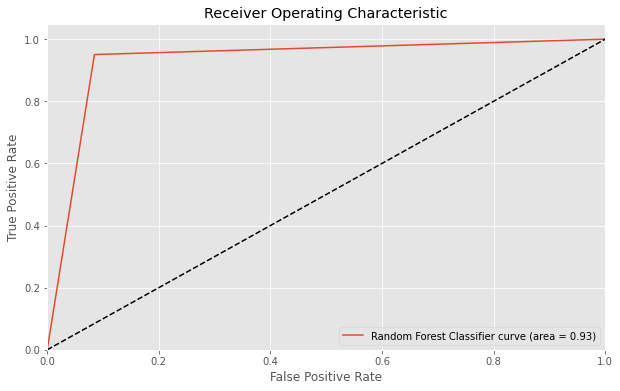

In [48]:
from sklearn.metrics import roc_auc_score, roc_curve

# Calculate the ROC-AUC score
roc_auc = roc_auc_score(y_test, y_pred)

# Calculate the false positive rate, true positive rate, and thresholds for the ROC curve
fpr, tpr, thresholds = roc_curve(y_test, y_pred)

# Plot the ROC curve
plt.figure(figsize=(10, 6))
plt.plot(fpr, tpr, label='Autoencoder Classifier curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], 'k--')  # Plot the diagonal line for reference
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc='lower right')
plt.show()

# Feature Importances

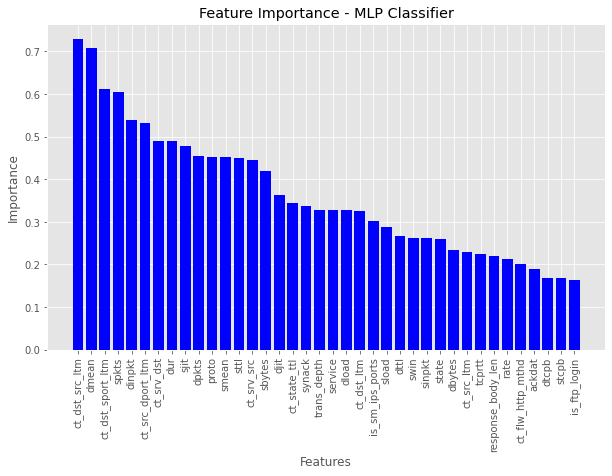

In [54]:
# Get the weights connecting the input layer to the first hidden layer
weights = mlp_classifier.coefs_[0]

# Calculate the feature importances based on the magnitudes of the weights
importances = np.abs(weights).mean(axis=1)

# Sort the features by their importances
indices = np.argsort(importances)[::-1]
feature_names = feature_list
updated_feature_names = [feature_names[i] for i in indices]
# Plot the feature importances
plt.figure(figsize=(10, 6))
plt.bar(range(len(indices)), importances[indices], color='b', align='center')
plt.xticks(range(X_train.shape[1]), [feature_names[i] for i in indices], rotation=90)
plt.xlabel('Features')
plt.ylabel('Importance')
plt.title('Feature Importance - MLP Classifier')
plt.show()

# Explain Predictions (SHAP)

In [ ]:
autoencoder = tf.keras.models.load_model("unsw_nb15_model_autoencoder.h5")

In [43]:
import shap

# Explain predictions using SHAP Kernel Explainer
explainer = shap.KernelExplainer(autoencoder, X_train[:10])

# Compute SHAP values for 10000 test data
shap_values = explainer.shap_values(X_test[:10000])


  0%|          | 0/10000 [00:00<?, ?it/s]

The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight

## SHAP Summary Plot (Bar Plot)

In [44]:
print(np.asarray(shap_values).shape)
shap_values_2 = np.asarray(shap_values)[0]
print(shap_values_2.shape)
# shap_values = shap_values.reshape(shap_values.shape[0], shap_values.shape[1])
# print(shap_values.shape)
# print(X_test[:1000].shape)

(1, 10000, 38)
(10000, 38)


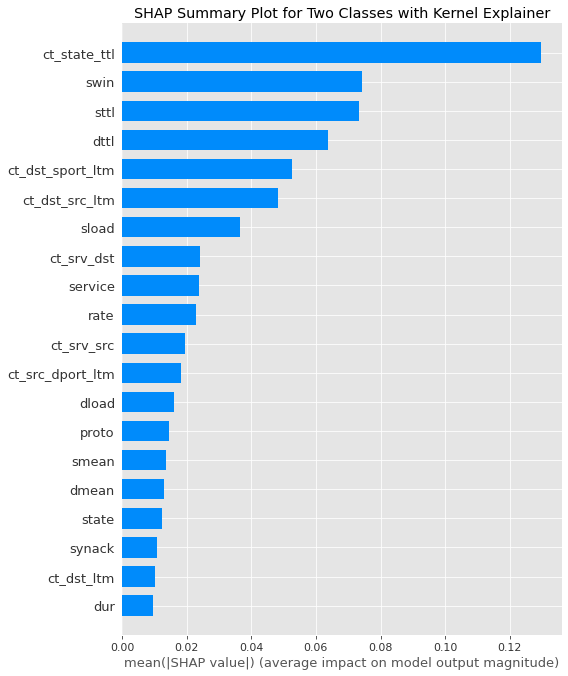

In [45]:
# Plot SHAP Tree Explainer for both classes 
plt.figure(figsize=(16, 8))
plt.title('SHAP Summary Plot for Two Classes with Kernel Explainer')
plt.xlabel('Mean SHAP Value (average impact on model output magnitude)')
shap.summary_plot(shap_values_2, X_test[:10000], plot_type="bar", feature_names=np.asarray(feature_list), class_names=ClassesToLabels)
plt.show()

## SHAP Summary Plot

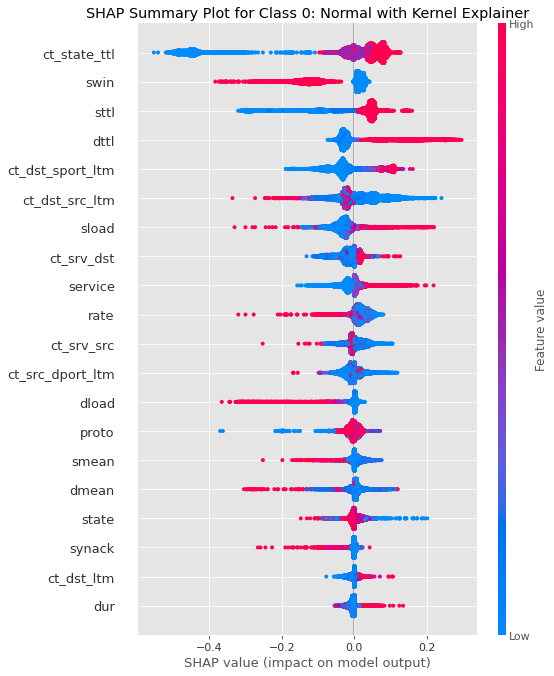

In [46]:
# Plot SHAP Tree Explainer for Normal Class
plt.figure(figsize=(16, 8))
plt.title('SHAP Summary Plot for Class 0: Normal with Kernel Explainer')
plt.xlabel('Mean SHAP Value (average impact on model output magnitude)')
shap.summary_plot(shap_values_2, X_test[:10000], feature_names = feature_list, class_names=ClassesToLabels)
plt.show()

## SHAP Dependence Plot (Feature 0)

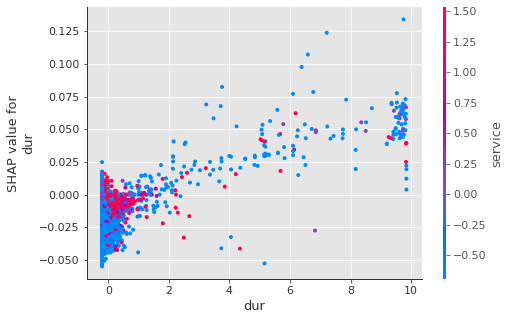

In [47]:
# Create the SHAP Dependence plot
shap.dependence_plot(0, shap_values_2, X_test[:10000], feature_names=feature_list)

## SHAP Dependence Plot (Feature 2)

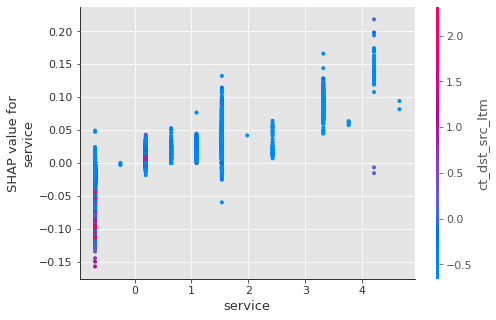

In [48]:
# Create the SHAP Dependence plot
shap.dependence_plot(2, shap_values_2, X_test[:10000], feature_names=feature_list)

## SHAP Waterfall Plot (Class 0, Single Sample)

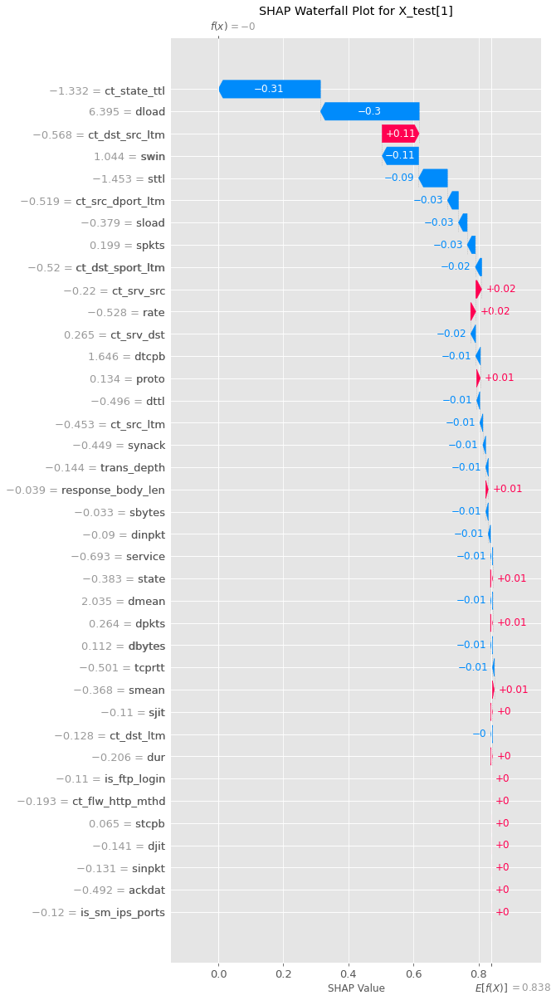

In [49]:
# Create the SHAP waterfall plot
exp = shap.Explanation(shap_values_2, explainer.expected_value[0], data=X_test, feature_names=feature_list)
idx = 1

# Set the title and axis labels
plt.figure(figsize=(16, 8))
plt.title('SHAP Waterfall Plot for X_test[{}]'.format(idx))
plt.xlabel('SHAP Value')
shap.plots.waterfall(exp[idx], max_display=40)
plt.show()

## SHAP Force Plot (10 Samples)

In [52]:
# Compute SHAP values for 1000 test data
shap_values_minimal = explainer.shap_values(X_test[:1000])
shap.initjs()

  0%|          | 0/1000 [00:00<?, ?it/s]

The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight

In [53]:
# Create the SHAP Force plot
shap.force_plot(explainer.expected_value[0], shap_values_minimal[0], feature_names = feature_list)

## SHAP Force Plot (Single Sample)

In [63]:
# Compute SHAP values for single test data
shap_values_single = explainer.shap_values(X_test[1])

The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 


In [64]:
shap.force_plot(explainer.expected_value[0], shap_values_single[0], feature_names = feature_list)

In [61]:
# Compute SHAP values for single test data
shap_values_single = explainer.shap_values(X_test[2])

The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 


In [62]:
shap.force_plot(explainer.expected_value[0], shap_values_single[0], feature_names = feature_list)

# Explain Predictions (Lime)

In [66]:
import lime
from lime import lime_tabular
from IPython.display import display, HTML

predict_fn_rf = lambda x: autoencoder.predict(x).astype(float)
explainer = lime.lime_tabular.LimeTabularExplainer(X_train[:10],
                                                   feature_names = feature_list,
                                                   class_names=['Normal','Attack'],
                                                   kernel_width=5)

choosen_instance = X_test[10]
exp = explainer.explain_instance(choosen_instance, 
                                 predict_fn_rf,
                                 num_features=X_train.shape[1])


# Get the feature importance values and names
importance_values = exp.as_list()
features, importance_scores = zip(*importance_values)

# Plot the feature importances
plt.figure(figsize=(10, 8))
plt.barh(range(len(features)), importance_scores, align='center')
plt.yticks(range(len(features)), features)
plt.xlabel('Importance Score')
plt.ylabel('Features')
plt.title('Lime Explanation')
plt.tight_layout()
plt.show()

exp.show_in_notebook(show_all=False)


# # Print the explanations
# print("Lime Explainer (Kernels):")
# print(exp.as_list())


                    Prediction probabilties do not sum to 1, and
                    thus does not constitute a probability space.
                    Check that you classifier outputs probabilities
                    (Not log probabilities, or actual class predictions).
                    


IndexError: index 1 is out of bounds for axis 1 with size 1

# ELI5

In [67]:
import eli5
from eli5.sklearn import PermutationImportance
import numpy as np
import matplotlib.pyplot as plt

# Create the ELI5 explainer
explainer = PermutationImportance(autoencoder, scoring='accuracy', random_state=42)

# Fit the explainer on the test data
explainer.fit(X_test[:10], y_test[:10])

# Get feature importances from the explainer
importances = explainer.feature_importances_
feature_names = np.array(feature_list)  # Replace with actual feature names

# Sort feature importances in descending order
indices = np.argsort(importances)[::-1]
sorted_feature_names = feature_names[indices]
sorted_importances = importances[indices]

# Generate explanations
explanations = eli5.explain_weights(explainer, feature_names=sorted_feature_names)

# Print explanations
print(explanations)

# Plot the feature importances
plt.figure(figsize=(10, 6))  # Adjust the figsize parameter as desired
plt.bar(range(len(sorted_importances)), sorted_importances)
plt.xticks(range(len(sorted_importances)), sorted_feature_names, rotation=90)
plt.xlabel('Features')
plt.ylabel('Importance')
plt.title('Feature Importances - ELI5')
plt.tight_layout()
plt.show()

ValueError: Classification metrics can't handle a mix of binary and continuous targets